# Comprehensive Exploratory Data Analysis (EDA) Notebook on Automobile Data

**Dataset URL:**  
`https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DA0101EN-SkillsNetwork/labs/Data%20files/automobileEDA.csv`

**Sample Data Snapshot:**  

| symboling | normalized-losses | make         | aspiration | num-of-doors | body-style  | drive-wheels | engine-location | wheel-base | length  | ... | compression-ratio | horsepower | peak-rpm | city-mpg | highway-mpg | price   | city-L/100km | horsepower-binned | diesel | gas |
|-----------|-------------------|--------------|------------|--------------|-------------|--------------|-----------------|------------|---------|-----|-------------------|------------|----------|----------|-------------|---------|--------------|-------------------|--------|-----|
| 3         | 122               | alfa-romero  | std        | two          | convertible | rwd          | front           | 88.6       | 0.81115 | ... | 9.0               | 111.0      | 5000.0   | 21       | 27          | 13495.0 | 11.190476    | Medium            | 0      | 1   |
| 3         | 122               | alfa-romero  | std        | two          | convertible | rwd          | front           | 88.6       | 0.81115 | ... | 9.0               | 111.0      | 5000.0   | 21       | 27          | 16500.0 | 11.190476    | Medium            | 0      | 1   |
| 1         | 122               | alfa-romero  | std        | two          | hatchback   | rwd          | front           | 94.5       | 0.82268 | ... | 9.0               | 154.0      | 5000.0   | 19       | 26          | 16500.0 | 12.368421    | Medium            | 0      | 1   |

This notebook covers:

1. **Foundational Data Understanding**
   - Data Structure Analysis & Data Granularity
   - Summary Statistics (central tendency, dispersion, skewness, kurtosis)

2. **Advanced Data Visualization**
   - Univariate Analysis (histograms, KDE plots, Q-Q plots)
   - Bivariate/Multivariate Analysis (scatter plots, heatmaps, pair plots)
   - Domain-Specific Visualizations (templates for time-series & geospatial)

3. **Data Quality & Preprocessing Insights**
   - Missing Data Analysis
   - Outlier Detection (IQR and Z-score methods)
   - Data Consistency Checks

4. **Feature Engineering & Selection**
   - Correlation Analysis & Multicollinearity (VIF, PCA)
   - Feature Importance & Interaction Effects

5. **Statistical & Hypothesis-Driven Analysis**
   - Hypothesis Testing (normality test, t-test, ANOVA, chi-square)
   - Sampling Strategy for Class Imbalance (template)

6. **Domain Context Integration**
7. **Automation & Scalability** (using pandas-profiling, Sweetviz)
8. **Ethical & Compliance Considerations**
9. **Communication & Collaboration** (interactive Plotly plots)
10. **Advanced Techniques**
   - Dimensionality Reduction (PCA, t-SNE, UMAP)
   - Interactive Visualizations
11. **Integration with ML Workflow**
12. **Continuous Learning**

Let’s begin by importing libraries and loading the data.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from pandas.plotting import scatter_matrix
import warnings
warnings.filterwarnings('ignore')

# Advanced techniques & interactive visualization libraries
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from statsmodels.stats.outliers_influence import variance_inflation_factor
import plotly.express as px
from sklearn.preprocessing import StandardScaler

# UMAP (if installed, otherwise install via: pip install umap-learn)
try:
    import umap.umap_ as umap
except ImportError:
    print("UMAP is not installed. To use UMAP, please install it with 'pip install umap-learn'.")

sns.set(style="whitegrid")

# Load the automobile dataset
data_url = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DA0101EN-SkillsNetwork/labs/Data%20files/automobileEDA.csv'
df = pd.read_csv(data_url)

# Display the first few rows to get familiar with the sample data
df.head(5)

,symboling,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,...,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,city-L/100km,horsepower-binned,diesel,gas
0,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,...,9.0,111.0,5000.0,21,27,13495.0,11.190476,Medium,0,1
1,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,...,9.0,111.0,5000.0,21,27,16500.0,11.190476,Medium,0,1
2,1,122,alfa-romero,std,two,hatchback,rwd,front,94.5,0.822681,...,9.0,154.0,5000.0,19,26,16500.0,12.368421,Medium,0,1
3,2,164,audi,std,four,sedan,fwd,front,99.8,0.848630,...,10.0,102.0,5500.0,24,30,13950.0,9.791667,Medium,0,1
4,2,164,audi,std,four,sedan,4wd,front,99.4,0.848630,...,8.0,115.0,5500.0,18,22,17450.0,13.055556,Medium,0,1


## 1. Foundational Data Understanding

### 1.1 Data Structure Analysis

Let's explore the dimensions, data types, and sample rows. Note that our sample data includes columns like `symboling`, `normalized-losses`, `make`, `aspiration`, and more.

In [4]:
# Check the dataset dimensions
print("Dataset Shape:", df.shape)

Dataset Shape: (201, 29)


In [5]:
# Get info on data types and non-null counts
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201 entries, 0 to 200
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          201 non-null    int64  
 1   normalized-losses  201 non-null    int64  
 2   make               201 non-null    object 
 3   aspiration         201 non-null    object 
 4   num-of-doors       201 non-null    object 
 5   body-style         201 non-null    object 
 6   drive-wheels       201 non-null    object 
 7   engine-location    201 non-null    object 
 8   wheel-base         201 non-null    float64
 9   length             201 non-null    float64
 10  width              201 non-null    float64
 11  height             201 non-null    float64
 12  curb-weight        201 non-null    int64  
 13  engine-type        201 non-null    object 
 14  num-of-cylinders   201 non-null    object 
 15  engine-size        201 non-null    int64  
 16  fuel-system        201 non

In [6]:
# List column names and display a sample of rows
print("Columns in Dataset:", df.columns.tolist())
df.head(5)

Columns in Dataset: ['symboling', 'normalized-losses', 'make', 'aspiration', 'num-of-doors', 'body-style', 'drive-wheels', 'engine-location', 'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type', 'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke', 'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg', 'highway-mpg', 'price', 'city-L/100km', 'horsepower-binned', 'diesel', 'gas']


,symboling,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,...,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,city-L/100km,horsepower-binned,diesel,gas
0,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,...,9.0,111.0,5000.0,21,27,13495.0,11.190476,Medium,0,1
1,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,...,9.0,111.0,5000.0,21,27,16500.0,11.190476,Medium,0,1
2,1,122,alfa-romero,std,two,hatchback,rwd,front,94.5,0.822681,...,9.0,154.0,5000.0,19,26,16500.0,12.368421,Medium,0,1
3,2,164,audi,std,four,sedan,fwd,front,99.8,0.848630,...,10.0,102.0,5500.0,24,30,13950.0,9.791667,Medium,0,1
4,2,164,audi,std,four,sedan,4wd,front,99.4,0.848630,...,8.0,115.0,5500.0,18,22,17450.0,13.055556,Medium,0,1


### 1.2 Assessing Data Granularity

While this dataset isn’t time-series or hierarchical, if you had a date column you would:

```python
df['date'] = pd.to_datetime(df['date'])
print(df['date'].min(), df['date'].max())
```

For automobile data, each row is one car record.

### 1.3 Summary Statistics

We compute measures of central tendency, dispersion, skewness, and kurtosis. This gives us insight into the distribution of numeric features (e.g., `normalized-losses`, `horsepower`, `price`).

Kurtosis is a measure of the tailedness of a distribution:

· Kurtosis is one of the two measures that quantify shape of a distribution. kutosis determine the volume of the outlier
· Kurtosis describes the peakedness of the distribution.
· a central moment is the expected value of a random variable's deviation from its mean.

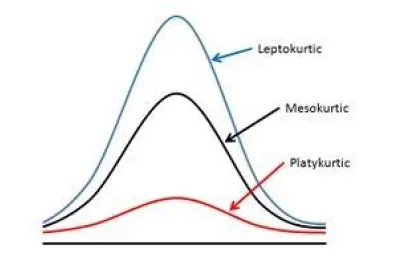
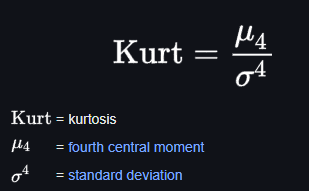


Skewness, a measure of asymmetry in a distribution

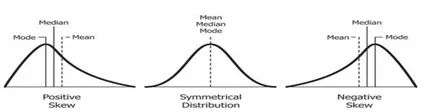

- Skewness = E[(X - μ) / σ]³

· If the skewness is between -0.5 and 0.5, the data are fairly symmetrical

· If the skewness is between -1 and — 0.5 or between 0.5 and 1, the data are moderately skewed

· If the skewness is less than -1 or greater than 1, the data are highly skewed


In [7]:
# Select numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns

# Basic descriptive statistics
desc_stats = df[numeric_cols].describe().T
desc_stats['skew'] = df[numeric_cols].skew()
desc_stats['kurtosis'] = df[numeric_cols].kurtosis()
desc_stats

,count,mean,std,min,25%,50%,75%,max,skew,kurtosis
symboling,201.0,0.840796,1.254802,-2.000000,0.000000,1.000000,2.000000,3.000000,0.197370,-0.707178
normalized-losses,201.0,122.000000,31.996250,65.000000,101.000000,122.000000,137.000000,256.000000,0.846546,1.319068
wheel-base,201.0,98.797015,6.066366,86.600000,94.500000,97.000000,102.400000,120.900000,1.031261,0.948445
length,201.0,0.837102,0.059213,0.678039,0.801538,0.832292,0.881788,1.000000,0.154446,-0.065192
width,201.0,0.915126,0.029187,0.837500,0.890278,0.909722,0.925000,1.000000,0.875029,0.678655
height,201.0,53.766667,2.447822,47.800000,52.000000,54.100000,55.500000,59.800000,0.029173,-0.432908
curb-weight,201.0,2555.666667,517.296727,1488.000000,2169.000000,2414.000000,2926.000000,4066.000000,0.705804,0.034916
engine-size,201.0,126.875622,41.546834,61.000000,98.000000,120.000000,141.000000,326.000000,1.979144,5.497491
bore,201.0,3.330692,0.268072,2.540000,3.150000,3.310000,3.580000,3.940000,-0.032730,-0.798193
stroke,197.0,3.256904,0.319256,2.070000,3.110000,3.290000,3.410000,4.170000,-0.693778,2.028784


## 2. Advanced Data Visualization

### 2.1 Univariate Analysis

#### 2.1.1 Histograms & KDE Plots

Visualize the distribution of numeric features with histograms and kernel density estimates.

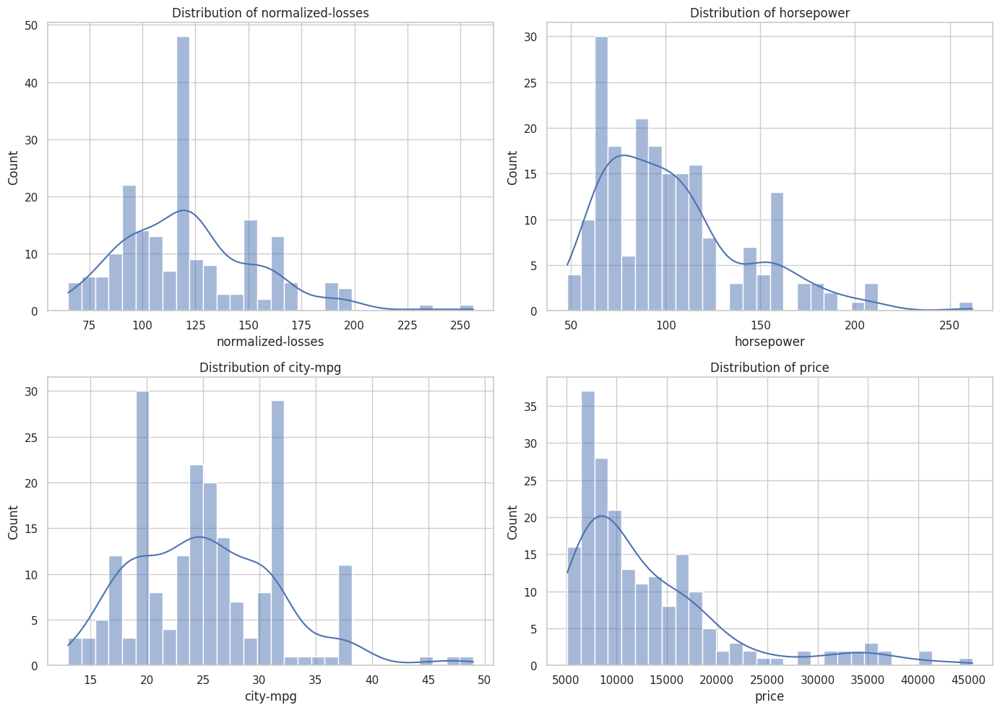

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(14,10))
# Use a few example features from our dataset. Adjust list if needed.
example_features = [col for col in ['normalized-losses', 'horsepower', 'city-mpg', 'price'] if col in numeric_cols]
for ax, feature in zip(axes.flatten(), example_features):
    sns.histplot(df[feature].dropna(), kde=True, ax=ax, bins=30)
    ax.set_title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

#### 2.1.2 Q-Q Plots

Q-Q (quantile quantile) plots help assess normality. We plot them for the same features.
* Helps to figure out that our data fits aginst what distribution.

https://www.youtube.com/watch?v=okjYjClSjOg&ab_channel=StatQuestwithJoshStarmer

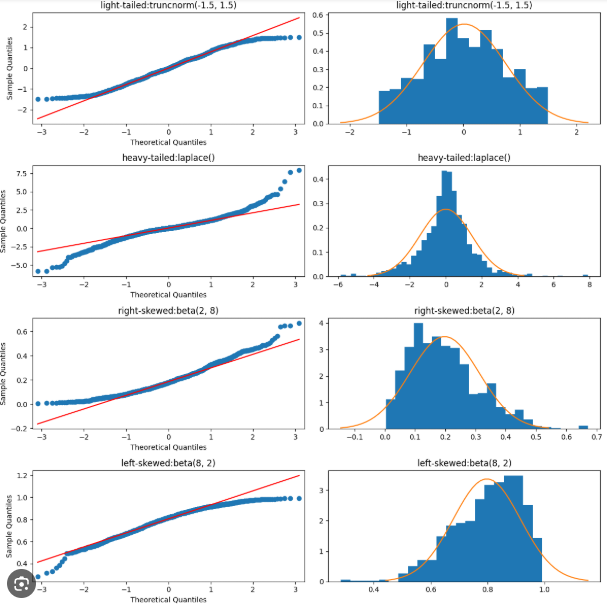 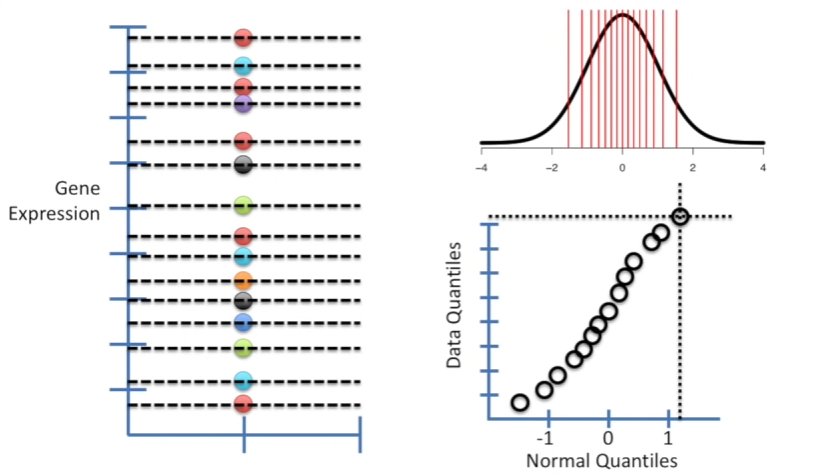

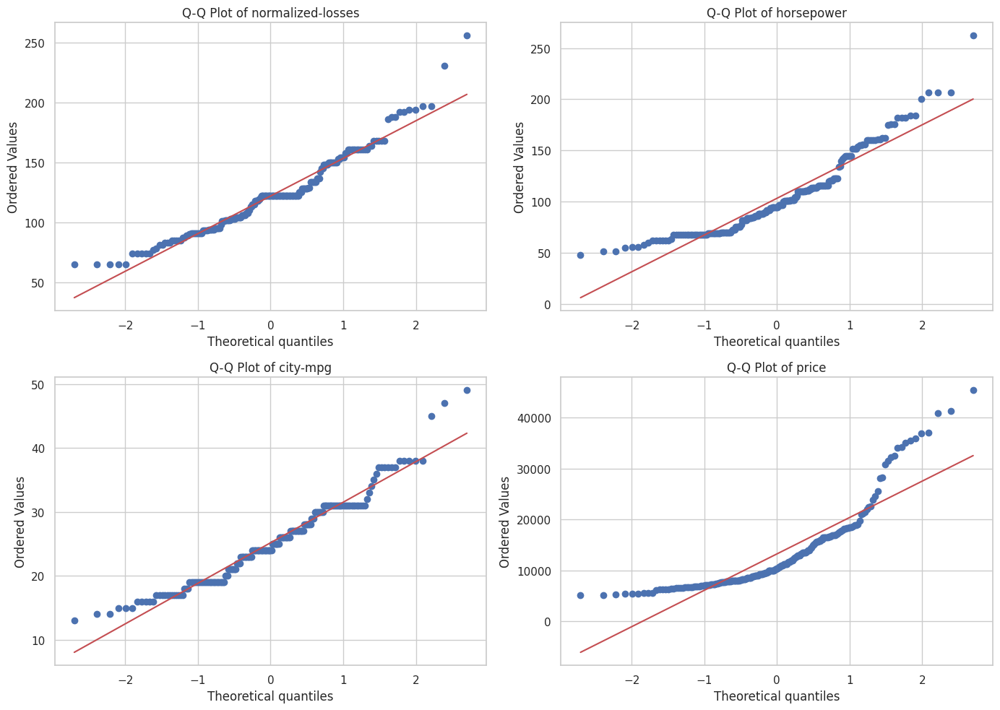

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, feature in zip(axes.flatten(), example_features):
    stats.probplot(df[feature].dropna(), dist="norm", plot=ax)
    ax.set_title(f'Q-Q Plot of {feature}')
plt.tight_layout()
plt.show()

### 2.2 Bivariate and Multivariate Analysis

#### 2.2.1 Scatter Matrix and Pair Plots

- Assess Distributions: Use the diagonal plots to understand the distribution of individual variables.
- Examine Relationships: Analyze scatter plots for evidence of linear, non-linear relationships, or potential multicollinearity.
- Evaluate Group Separation: When using hue, check if categories are well-separated, which can be a strong indicator of predictive power.
- Identify Anomalies: Spot outliers that may need to be addressed through data cleaning.

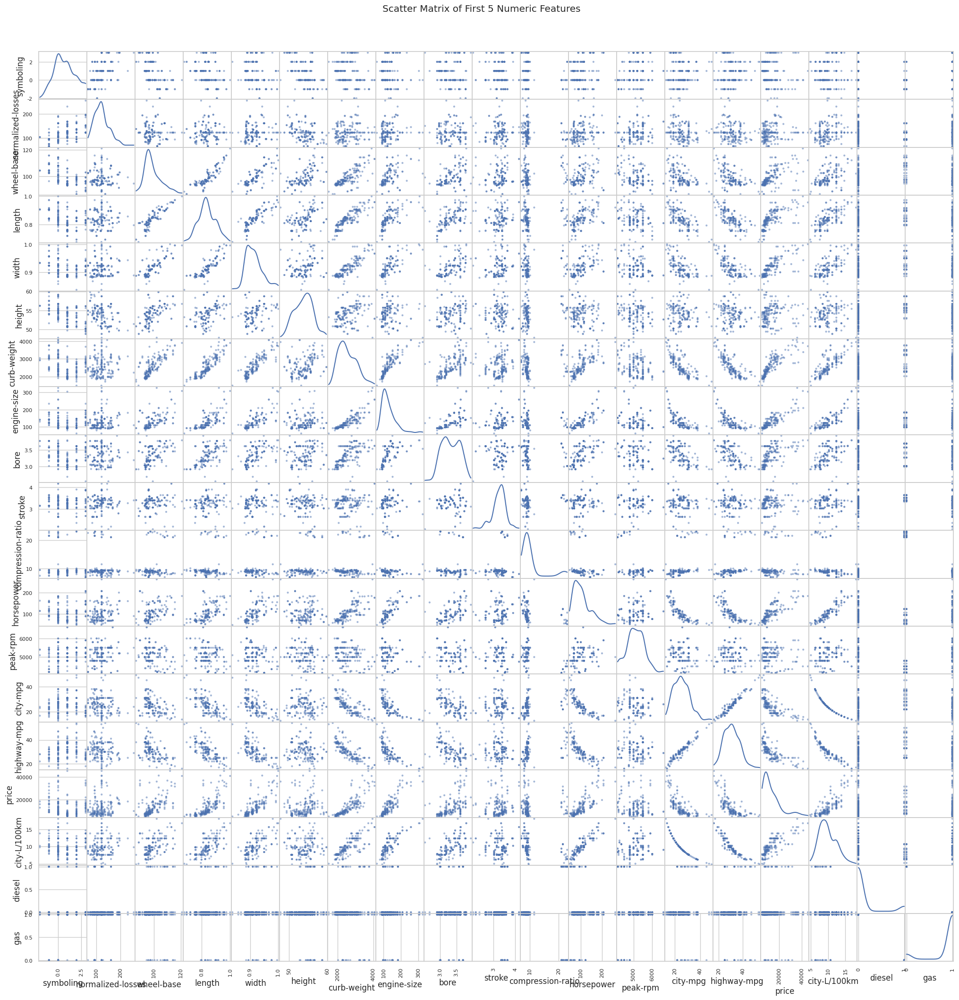

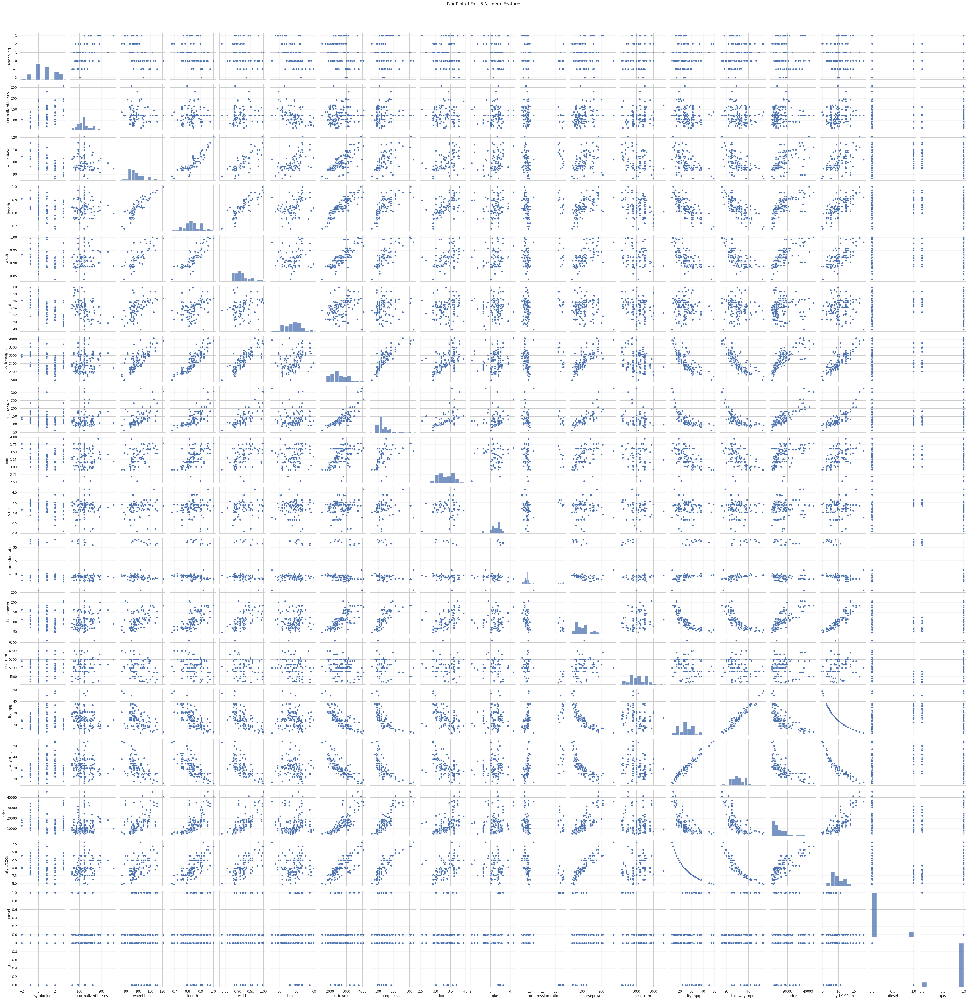

In [10]:
# Scatter matrix for selected numeric features (example: first 5 numeric features)
scatter_matrix(df[numeric_cols].dropna(), figsize=(25, 25), diagonal='kde')
plt.suptitle("Scatter Matrix of First 5 Numeric Features", y=0.92)
plt.show()

# Seaborn pairplot for the same features
sns.pairplot(df[numeric_cols].dropna())
plt.suptitle("Pair Plot of First 5 Numeric Features", y=1.02)
plt.show()

#### 2.2.2 Correlation Heatmap

Visualize correlations among numeric features. This helps in feature selection later.

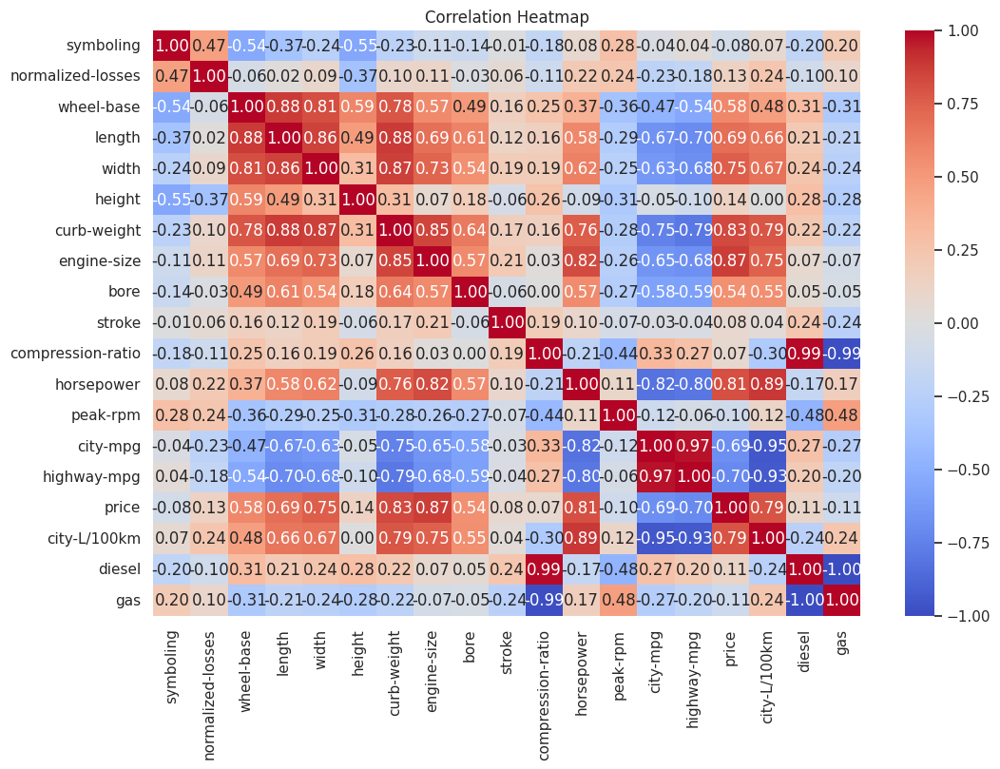

In [11]:
plt.figure(figsize=(12, 8))
corr_matrix = df[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

#### 2.2.3 Domain-Specific Visualizations

**Time-Series Decomposition Template:**  
If you had a time-related column, you could decompose a variable (e.g., price) to study trend and seasonality.

```python
from statsmodels.tsa.seasonal import seasonal_decompose
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)
decomposition = seasonal_decompose(df['price'], model='additive', period=12)
decomposition.plot()
plt.show()
```

**Geospatial Mapping Template:**  
For datasets with geospatial information (latitude/longitude):

```python
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="city",
                        mapbox_style="carto-positron", zoom=3)
fig.show()
```

Since our dataset lacks these columns, these examples serve as a template for future projects.

## 3. Data Quality & Preprocessing Insights

### 3.1 Missing Data Analysis

Identify missing values and calculate the percentage of missingness for each column.

In [12]:
missing_counts = df.isnull().sum()
missing_percentage = (missing_counts / len(df)) * 100
missing_df = pd.DataFrame({'Missing Count': missing_counts, 'Missing Percentage': missing_percentage})
# Display only columns with missing values
print(missing_df[missing_df['Missing Count'] > 0].sort_values("Missing Percentage", ascending=False))

# You may  impute or drop the data based on business case and % of missing data


                   Missing Count  Missing Percentage
stroke                         4            1.990050
horsepower-binned              1            0.497512


### 3.2 Outlier Detection

#### 3.2.1 IQR Method

Function to detect outliers using the IQR method.
- calculation-> Q1 is 1/4th value of n (n is the size of data)
- IQR = Q3 - Q1

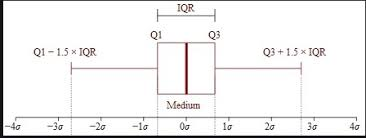

In [13]:
def detect_outliers_iqr(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[col] < lower_bound) | (data[col] > upper_bound)]

# Apply IQR method for a few numeric features (example: normalized-losses, horsepower, price)
for feature in [f for f in ['normalized-losses', 'horsepower', 'price'] if f in numeric_cols]:
    outliers = detect_outliers_iqr(df, feature)
    print(f"Feature: {feature} - Number of Outliers Detected (IQR): {len(outliers)}")

Feature: normalized-losses - Number of Outliers Detected (IQR): 8
Feature: horsepower - Number of Outliers Detected (IQR): 5
Feature: price - Number of Outliers Detected (IQR): 14


#### 3.2.2 Z-Score Method

Detect outliers using Z-score. Values with a Z-score greater than 3 (by absolute value) are flagged.

A Z-score (also called a standard score) measures how many standard deviations a data point is away from the mean of a dataset. It helps determine whether a value is typical or an outlier.

The formula for calculating the Z-score of a data point 

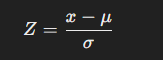

Z score helps in:

✅ Outlier Detection – Helps identify extreme values in a dataset.

✅ Comparison Across Different Datasets – Standardizes values, making them comparable across different distributions.

✅ Normality Testing – In a normal distribution, ~68% of values lie within ±1 Z-score, ~95% within ±2, and ~99.7% within ±3 (Empirical Rule).

✅ Feature Scaling in Machine Learning – Used in Z-score normalization (Standardization) to bring all features to the same scale.

In [14]:
def detect_outliers_zscore(data, col, threshold=3):
    z_scores = np.abs(stats.zscore(data[col].dropna()))
    return data[z_scores > threshold]

for feature in [f for f in ['normalized-losses', 'horsepower', 'price'] if f in numeric_cols]:
    outliers_z = detect_outliers_zscore(df, feature)
    print(f"Feature: {feature} - Number of Outliers Detected (Z-score): {len(outliers_z)}")

Feature: normalized-losses - Number of Outliers Detected (Z-score): 2
Feature: horsepower - Number of Outliers Detected (Z-score): 1
Feature: price - Number of Outliers Detected (Z-score): 4


### 3.3 Data Consistency Checks

Check categorical columns for consistency. For example, inspect the unique values in `fuel-system`.

In [15]:
if 'fuel-system' in df.columns:
    print("Unique values in 'fuel-system':", df['fuel-system'].unique())
    print("Frequency counts:\n", df['fuel-system'].value_counts())

# You can perform similar checks for other categorical columns like 'aspiration', 'body-style', etc.

Unique values in 'fuel-system': ['mpfi' '2bbl' 'mfi' '1bbl' 'spfi' '4bbl' 'idi' 'spdi']
Frequency counts:
 fuel-system
mpfi    92
2bbl    64
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: count, dtype: int64


## 4. Feature Engineering & Selection

### 4.1 Correlation Analysis & Multicollinearity

#### 4.1.1 Pearson and Spearman Correlation

Calculate Pearson and Spearman correlations.

Pearsons correlation

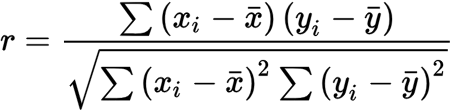


- Assumption: Assumes a linear relationship and that data is normally distributed.
- Use Case: Suitable for continuous data when you want to measure linear associations.
- Strength: Sensitive to linear relationships, good for capturing linear trends.
- Formula: Based on covariance and standard deviations of the original data.
- Interpretation: Measures the strength and direction of the linear relationship, ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation), with 0 indicating no linear correlation.

In [16]:
# Pearson correlation
pearson_corr = df[numeric_cols].corr(method='pearson')
print("Pearson Correlation Matrix:\n", pearson_corr)

Pearson Correlation Matrix:
                    symboling  normalized-losses  wheel-base    length  \
symboling           1.000000           0.466264   -0.535987 -0.365404   
normalized-losses   0.466264           1.000000   -0.056661  0.019424   
wheel-base         -0.535987          -0.056661    1.000000  0.876024   
length             -0.365404           0.019424    0.876024  1.000000   
width              -0.242423           0.086802    0.814507  0.857170   
height             -0.550160          -0.373737    0.590742  0.492063   
curb-weight        -0.233118           0.099404    0.782097  0.880665   
engine-size        -0.110581           0.112360    0.572027  0.685025   
bore               -0.140019          -0.029862    0.493244  0.608971   
stroke             -0.008245           0.055563    0.158502  0.124139   
compression-ratio  -0.182196          -0.114713    0.250313  0.159733   
horsepower          0.075819           0.217299    0.371147  0.579821   
peak-rpm            0.

Spearman correlation

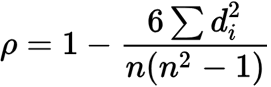

- Assumption: Non-parametric (Does not assume any particular distibution or ignore outliers) and does not assume a linear relationship but assumes a monotonic relationship.
- Use Case: Appropriate for both continuous and ordinal data. Particularly useful when the relationship is expected to be monotonic but not necessarily linear.
- Strength: Robust to outliers and non-linearity.
- Formula: Calculates the correlation based on the ranks of data points.
- Interpretation: Measures the strength and direction of the monotonic relationship, similar to Kendall’s Tau.

In [17]:

spearman_corr = df[numeric_cols].corr(method='spearman')
print("Spearman Correlation Matrix:\n", spearman_corr)

Spearman Correlation Matrix:
                    symboling  normalized-losses  wheel-base    length  \
symboling           1.000000           0.483960   -0.542030 -0.404203   
normalized-losses   0.483960           1.000000   -0.072600  0.045926   
wheel-base         -0.542030          -0.072600    1.000000  0.913120   
length             -0.404203           0.045926    0.913120  1.000000   
width              -0.260553           0.117695    0.815524  0.889761   
height             -0.529907          -0.345880    0.641402  0.532213   
curb-weight        -0.260517           0.123187    0.764638  0.889759   
engine-size        -0.181819           0.124089    0.645661  0.779691   
bore               -0.180029          -0.022405    0.537537  0.639575   
stroke             -0.011853           0.108541    0.218058  0.172721   
compression-ratio   0.020986          -0.067848   -0.119545 -0.180277   
horsepower         -0.004021           0.236603    0.495114  0.660012   
peak-rpm            0

Kendalls correlation

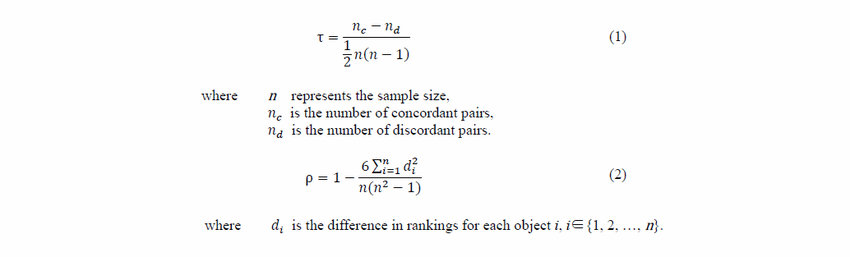


- Assumption: Non-parametric and makes no assumptions about the data distribution.
- Use Case: Suitable for both continuous and ordinal (ranked) data. Useful when the data may not follow a linear relationship.
- Strength: Robust to outliers and non-linearity.
- Formula: Based on concordant and discordant pairs of data points. (strictly increasing or strictly decreasing)
- Interpretation: Measures the similarity in ranking order between two variables, where 1 indicates perfect agreement, -1 indicates perfect disagreement, and 0 suggests no association.

Let’s look at the key differences:
 - Assumptions: Pearson correlation assumes linearity and normality, while Kendall and Spearman correlations make fewer assumptions about data distribution.
 - Data Type: Pearson is best suited for continuous data, while Kendall and Spearman can handle ordinal (ranked) data.
 - Robustness: Kendall and Spearman are more robust to outliers and non-linear relationships compared to Pearson.
 - Interpretation: Kendall and Spearman measure monotonic relationships, while Pearson measures linear relationships.
 - Strength of Association: Pearson is sensitive to both the magnitude and direction of linear associations, while Kendall and Spearman focus on the direction and orderings of data.
 - Calculation: Pearson is based on the raw data, while Kendall and Spearman use rankings

Variance Inflation Factor (VIF)
for multicollinearity  - reduces multicollinearity, we should keep it under 10. Drop or merge features with VIF above 10.

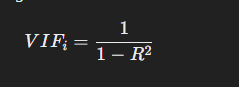

R^2 :coefficient of determination from the regression of depenent on other independent variables.

In [18]:
 
X = df[numeric_cols].dropna()
vif_df = pd.DataFrame()
vif_df['Feature'] = X.columns
vif_df['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print("VIF Values:\n", vif_df)

VIF Values:
               Feature          VIF
0           symboling     2.265693
1   normalized-losses     1.671556
2          wheel-base     9.412386
3              length    10.511374
4               width     6.199743
5              height     2.686599
6         curb-weight    16.988499
7         engine-size    13.994869
8                bore     2.410484
9              stroke     1.863335
10  compression-ratio    74.619715
11         horsepower    10.709019
12           peak-rpm     2.477436
13           city-mpg    38.850391
14        highway-mpg    25.799719
15              price     7.361111
16       city-L/100km    36.611428
17             diesel   854.617416
18                gas  5911.074589


#### 4.1.2 Dimensionality Reduction using PCA
https://www.youtube.com/watch?v=FgakZw6K1QQ&ab_channel=StatQuestwithJoshStarmer  
Reduce the dimensionality to uncover latent patterns.  
Steps:
- plot the data points
- shift the datapoints to have center in origin
- find the line that maximises the distance between origin and projected data point (For better calculation else you can also say find the best fit line)
- This becomes PC1. Sum of square of distcance of projected points on PC1 to origin (divided by n-1) is the Eigen value and it tells the varaince.
- Make PC2 which is perpandicular to PC1. and the eigen values are sum of square distance b/w projected points on PC2 from origin  (divided by n-1).
- ratio of eigen values tell the imporance of that component. You may drop any PC if its irrelavant.
- To convert to lower dimension PC we would project the samples of (removed PC) on to the remainig PCs.
- Then we will update the sample values with the PC values.   

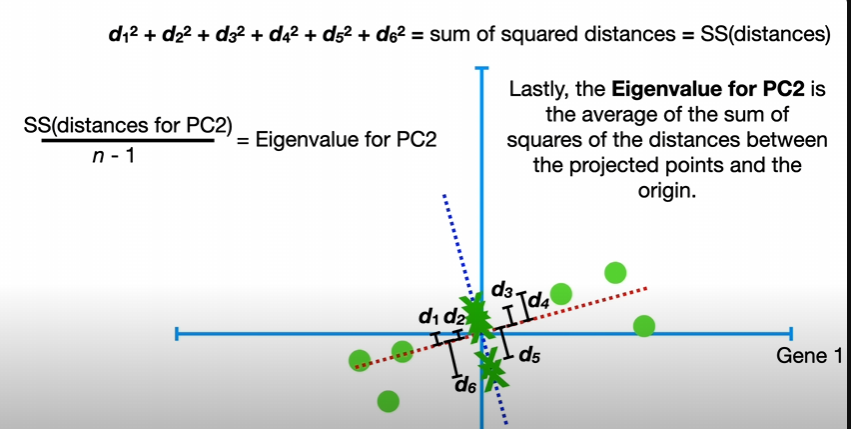  
Learn what Eigen values and Eigen vectors are

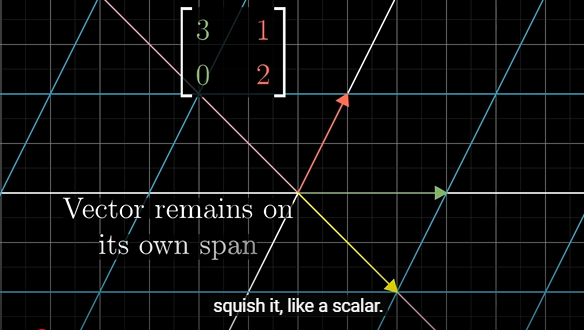

- |λI − A| = 0  to find λ (eigen value)

so det(|λI − A|) = 0  which means this transformation (A - λI) squishes the space in lower dimension because (= 0) here 0 is the squshed 0 vector.

For diagnonal matrix all basis vectors are diagnal vectors
We can change the coordinate system by making the transformation of making the eigen vectors as basis.

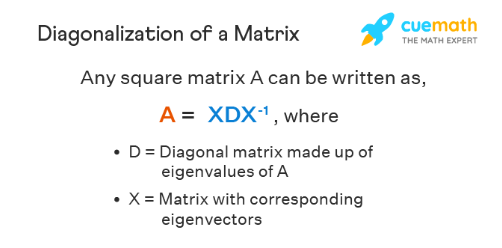

PCA: https://medium.com/@noorulhudaajmal12/understanding-principal-component-analysis-pca-f831f0ce08c5

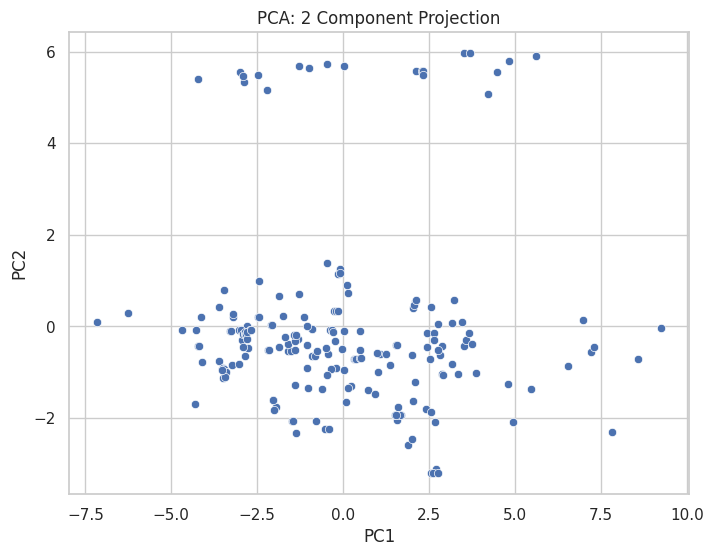

array([8.43633306, 4.26319952])

In [19]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[numeric_cols].dropna())
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_features)
pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2']) # --> reduce down to only 2 principal components

plt.figure(figsize=(8,6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA: 2 Component Projection')
plt.show()

pca.explained_variance_
#pca.explained_variance_ tells the variance. You can drop lower variance as it has less info

### 4.2 Feature Importance & Interaction Effects

#### 4.2.1 Feature Importance Example

As an example, rank features by their correlation with `price`.

In [20]:
if 'price' in df.columns:
    correlations = df.corr(numeric_only=True)['price'].abs().sort_values(ascending=False)
    print("Feature Importance (Absolute Correlation with Price):")
    print(correlations)

Feature Importance (Absolute Correlation with Price):
price                1.000000
engine-size          0.872335
curb-weight          0.834415
horsepower           0.809575
city-L/100km         0.789898
width                0.751265
highway-mpg          0.704692
length               0.690628
city-mpg             0.686571
wheel-base           0.584642
bore                 0.543155
height               0.135486
normalized-losses    0.133999
diesel               0.110326
gas                  0.110326
peak-rpm             0.101616
symboling            0.082391
stroke               0.082310
compression-ratio    0.071107
Name: price, dtype: float64


#### 4.2.2 Interaction Effects

Create a new feature to capture an interaction effect.
For example, if both `engine-size` and `horsepower` exist, create a ratio.

In [21]:
if set(['engine-size', 'horsepower']).issubset(df.columns):
    df['engine_hp_ratio'] = df['engine-size'] / df['horsepower']
    print(df[['engine-size', 'horsepower', 'engine_hp_ratio']].head())

   engine-size  horsepower  engine_hp_ratio
0          130       111.0         1.171171
1          130       111.0         1.171171
2          152       154.0         0.987013
3          109       102.0         1.068627
4          136       115.0         1.182609


## 5. Statistical & Hypothesis-Driven Analysis

### 5.1 Hypothesis Testing

Hypothesis testing is a statistical method used to make inferences about a population (real world) based  on sample data. It helps determine if there is enough evidence to support or reject a claim

Key Terms in Hypothesis Testing: 

🔹 𝐍𝐮𝐥𝐥 𝐇𝐲𝐩𝐨𝐭𝐡𝐞𝐬𝐢𝐬 (𝐇₀) → 𝑇ℎ𝑒𝑟𝑒 𝑖𝑠 𝑛𝑜 𝑠𝑖𝑔𝑛𝑖𝑓𝑖𝑐𝑎𝑛𝑡 𝑒𝑓𝑓𝑒𝑐𝑡 𝑜𝑟 𝑟𝑒𝑙𝑎𝑡𝑖𝑜𝑛𝑠ℎ𝑖𝑝. (𝑒.𝑔., 𝑇ℎ𝑒 𝑚𝑒𝑎𝑛 𝑠𝑎𝑙𝑎𝑟𝑦 𝑜𝑓 𝑚𝑒𝑛 𝑎𝑛𝑑 𝑤𝑜𝑚𝑒𝑛 𝑖𝑠 𝑡ℎ𝑒 𝑠𝑎𝑚𝑒.)

🔹 𝐀𝐥𝐭𝐞𝐫𝐧𝐚𝐭𝐢𝐯𝐞 𝐇𝐲𝐩𝐨𝐭𝐡𝐞𝐬𝐢𝐬 (𝐇₁) → 𝑇ℎ𝑒𝑟𝑒 𝑖𝑠 𝑎 𝑠𝑖𝑔𝑛𝑖𝑓𝑖𝑐𝑎𝑛𝑡 𝑒𝑓𝑓𝑒𝑐𝑡 𝑜𝑟 𝑟𝑒𝑙𝑎𝑡𝑖𝑜𝑛𝑠ℎ𝑖𝑝. (𝑒.𝑔., 𝑇ℎ𝑒 𝑚𝑒𝑎𝑛 𝑠𝑎𝑙𝑎𝑟𝑦 𝑜𝑓 𝑚𝑒𝑛 𝑎𝑛𝑑 𝑤𝑜𝑚𝑒𝑛 𝑖𝑠 𝑑𝑖𝑓𝑓𝑒𝑟𝑒𝑛𝑡.)

🔹 Significance Level (𝛼): The threshold probability for rejecting 𝐻0 (usually 0.05 or 5%).

🔹 P-value: The probability of obtaining test results at least as extreme as the observed results, assuming 𝐻0 is true.

Test Statistic: A value calculated from the sample data used to determine whether to reject 𝐻0.

✴️ 𝐒𝐭𝐞𝐩𝐬 𝐢𝐧 𝐇𝐲𝐩𝐨𝐭𝐡𝐞𝐬𝐢𝐬 𝐓𝐞𝐬𝐭𝐢𝐧𝐠  
1️⃣ 𝐃𝐞𝐟𝐢𝐧𝐞 𝐇₀ 𝐚𝐧𝐝 𝐇₁  
2️⃣ 𝐂𝐡𝐨𝐨𝐬𝐞 𝐚 𝐒𝐢𝐠𝐧𝐢𝐟𝐢𝐜𝐚𝐧𝐜𝐞 𝐋𝐞𝐯𝐞𝐥 (𝛼) (𝑢𝑠𝑢𝑎𝑙𝑙𝑦 0.05)  
3️⃣ 𝐂𝐨𝐦𝐩𝐮𝐭𝐞 𝐭𝐡𝐞 𝐓𝐞𝐬𝐭 𝐒𝐭𝐚𝐭𝐢𝐬𝐭𝐢𝐜 (𝑡-𝑡𝑒𝑠𝑡, 𝑧-𝑡𝑒𝑠𝑡, 𝑐ℎ𝑖-𝑠𝑞𝑢𝑎𝑟𝑒, 𝑒𝑡𝑐.)  
4️⃣ 𝐂𝐨𝐦𝐩𝐚𝐫𝐞 𝐭𝐡𝐞 𝐏-𝐯𝐚𝐥𝐮𝐞  

𝑃 < 𝛼 → 𝑅𝑒𝑗𝑒𝑐𝑡 𝐻0  (𝐒𝐢𝐠𝐧𝐢𝐟𝐢𝐜𝐚𝐧𝐭 𝐑𝐞𝐬𝐮𝐥𝐭)  
𝑃 > 𝛼 → 𝐅𝐚𝐢𝐥 𝐭𝐨 𝐑𝐞𝐣𝐞𝐜𝐭 𝐻0 (𝐍𝐨𝐭 𝐄𝐧𝐨𝐮𝐠𝐡 𝐄𝐯𝐢𝐝𝐞𝐧𝐜𝐞)  
💡 𝐄𝐱𝐚𝐦𝐩𝐥𝐞: 𝐀 𝐜𝐨𝐦𝐩𝐚𝐧𝐲 𝐜𝐥𝐚𝐢𝐦𝐬 𝐭𝐡𝐞 𝐚𝐯𝐞𝐫𝐚𝐠𝐞 𝐝𝐞𝐥𝐢𝐯𝐞𝐫𝐲 𝐭𝐢𝐦𝐞 𝐢𝐬 𝟑𝟎 𝐦𝐢𝐧𝐬.  

𝐻0 : 𝑻𝒉𝒆 𝒂𝒗𝒆𝒓𝒂𝒈𝒆 𝒕𝒊𝒎𝒆 𝒊𝒔 𝟑𝟎 𝒎𝒊𝒏𝒔.

𝐻1: 𝑻𝒉𝒆 𝒂𝒗𝒆𝒓𝒂𝒈𝒆 𝒕𝒊𝒎𝒆 𝒊𝒔 𝒏𝒐𝒕 𝟑𝟎 𝒎𝒊𝒏𝒔.  
𝑖𝑓 𝑡ℎ𝑒 𝑝-𝑣𝑎𝑙𝑢𝑒 < 0.05, 𝑡ℎ𝑒 𝑐𝑜𝑚𝑝𝑎𝑛𝑦’𝑠 𝑐𝑙𝑎𝑖𝑚 𝑖𝑠 𝑓𝑎𝑙𝑠𝑒. 🚀

#### 5.1.1 Normality Test (Shapiro-Wilk)

Test whether a numeric feature is normally distributed. Here we test `normalized-losses`.

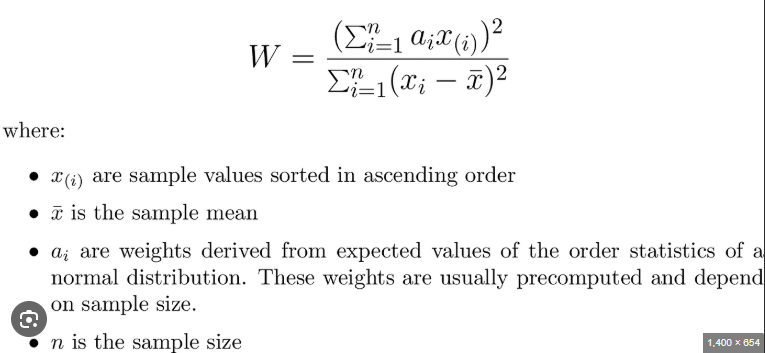

using table we can get p value based on W (How well the data matches the normal distribution).

if p value is small (<0.05) then we can say null hypothesis can be rejected, meaning data is not normally distributed.  

In [22]:
if 'normalized-losses' in df.columns:
    stat, p_value = stats.shapiro(df['normalized-losses'].dropna())
    print(f"Shapiro-Wilk Test for 'normalized-losses': Statistic={stat:.3f}, p-value={p_value:.3f}")
else:
    print("Column 'normalized-losses' not found.")

Shapiro-Wilk Test for 'normalized-losses': Statistic=0.951, p-value=0.000


#### 5.1.2 t-test: Comparing Means

Compare the means of two groups. For example, compare `price` between two `fuel-system` groups.

A t-test is a statistical test used to compare the means of two groups to determine if the difference between them is statistically significant or just due to random chance.

- You have two sets of data (e.g., test scores of two different classes).
- You calculate the average (mean) of each group.
- You measure how much the values in each group vary (standard deviation).
- The t-test calculates a "t-statistic", which tells you how different the two means are, relative to the variation in the data.
- It gives you a p-value, which tells you if the difference is significant


Types of t-tests




1. For One sample:  
    - One-sample t-test – Compares a single group's mean to a known value. Eg: A teacher wants to check if the average test score of a class (85) is different from the national average test score (80).  
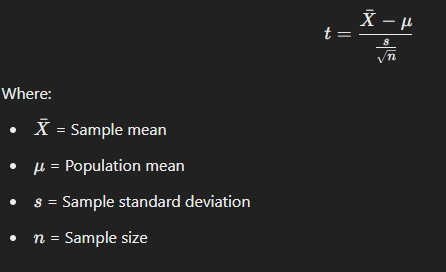

2. For Two sample:  
    - Two-sample (independent) t-test – Compares the means of two separate groups. Eg: Comparing test scores of two different classes (Class A and Class B).  
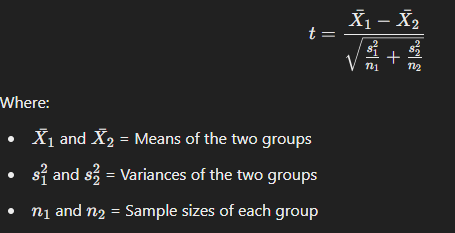

3. For Paired t-test (Dependent t-test):  
    - Paired t-test – Compares the means of the same group before and after a treatment (e.g., test scores before and after tutoring). Eg: A company tests a new training program by comparing employee productivity before and after the training.  
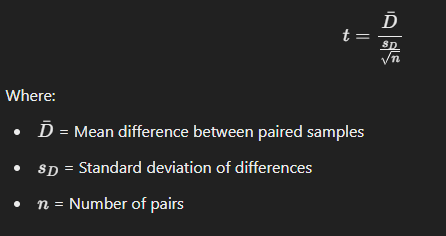

In [23]:
if set(['fuel-system', 'price']).issubset(df.columns):
    group1 = df[df['fuel-system'] == 'gas']['price'].dropna()
    group2 = df[df['fuel-system'] == 'diesel']['price'].dropna()
    t_stat, t_pvalue = stats.ttest_ind(group1, group2)
    print(f"t-test: t-statistic = {t_stat:.3f}, p-value = {t_pvalue:.3f}")
else:
    print("Required columns for t-test are missing.")

t-test: t-statistic = nan, p-value = nan


#### 5.1.3 ANOVA: Comparing More Than Two Groups
ANOVA (Analysis of Variance) is a statistical test used to compare the means of three or more groups to determine if there is a significant difference between them.

If the means are significantly different, we conclude that at least one group is different from the others. However, ANOVA doesn’t tell us which specific groups are different—only that a difference exists.

Types:
1. One-Way ANOVA – Compares one independent variable across multiple groups.
    - Example: Comparing the average test scores of three different classes.
2. Two-Way ANOVA – Compares two independent variables at the same time.
    - Example: Comparing test scores across three classes and also checking if gender (male vs. female) has an effect.    

ANNOVA calculation:  
ANOVA works by analyzing the variance within each group and between groups. The key calculations include:

1. Calculate the Group Means (𝑋𝐴,𝑋𝐵,𝑋𝐶)
2. Calculate the Overall Mean (𝑋ˉ)
3. Overall mean = sum of all values/total number of values
4. Calculate Sum of Squares Between Groups (SSB)
    - Measures how much the group means differ from the overall mean.  
    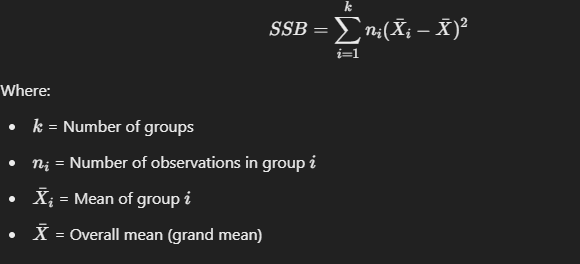
5. Calculate Sum of Squares Within Groups (SSW)
    - Measures how much the individual scores within each group vary from their group mean.  
    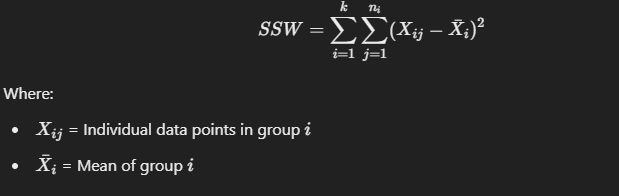
6. Compute the F-Statistic:
    - 𝐹=Variance between groups/Variance within groups.  
    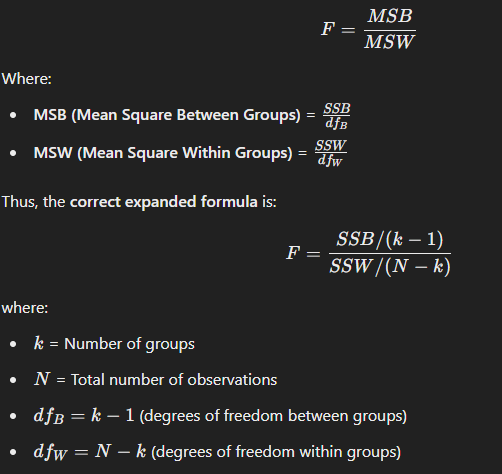

 
If 𝐹 is large, the groups are significantly different.  

Why use ANNOVA:  
✅ Compare Multiple Groups – ANOVA is designed to compare three or more groups in one test.  
✅ Controls Type I Error – Performing multiple t-tests increases the chance of false positives, whereas ANOVA controls this error.  
✅ Identifies Group Differences – ANOVA tells us if there is a significant difference among groups (though it does not specify which groups differ).  
✅ Used in Various Fields – Common in medicine, business, education, engineering, and social sciences for experiments and analysis.  

Use ANOVA to test if there are significant differences in `price` across different `body-style` groups.

In [ ]:
if set(['body-style', 'price']).issubset(df.columns):
    groups = [group['price'].dropna() for name, group in df.groupby('body-style')]
    f_stat, anova_p = stats.f_oneway(*groups)
    print(f"ANOVA: F-statistic = {f_stat:.3f}, p-value = {anova_p:.3f}")
else:
    print("Required columns for ANOVA are missing.")

ANOVA: F-statistic = 9.129, p-value = 0.000


Since the p-value (0) is less than 0.05, we will reject the null hypothesis. This means there is  significant difference between `price` across different `body-style` groups.

#### 5.1.4 Chi-Square Test for Independence 
A chi‐square test is a non‐parametric statistical test used to compare observed frequencies (counts) with expected frequencies under a specific hypothesis. It’s most commonly used for categorical (nominal or ordinal) data.

Steps to calculate:
1. Calculate Expected frequencies. (To understand place the data in row and column with observed count for each category)  
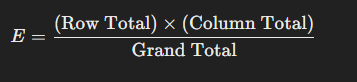

2. Compute the Chi-Squared Statistics:
    - Here O  means frequecy for that observation. (For each cell in the data frame)  
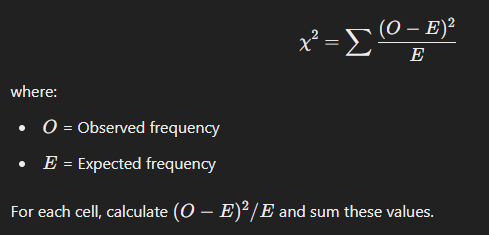
3. Determine the Degrees of Freedom (df):
    - df=(Number of Rows−1)×(Number of Columns−1)
4. Compare with the Critical Value or Compute the p-value:
    - Critical Value:
        - Look up the critical chi-square value for your calculated degrees of freedom at your chosen significance level (commonly α = 0.05) using a chi-square distribution table.

    - p-value:
        - Alternatively, determine the p-value corresponding to your chi-square statistic and df.

Test the independence between two categorical variables. For example, test if `fuel-system` is independent of `aspiration`.

In [26]:
if set(['fuel-system', 'aspiration']).issubset(df.columns):
    contingency_table = pd.crosstab(df['fuel-system'], df['aspiration'])
    chi2, chi2_p, dof, expected = stats.chi2_contingency(contingency_table)
    print("Chi-Square Test for Independence:")
    print(f"chi2 = {chi2:.3f}, p-value = {chi2_p:.3f}, degrees of freedom = {dof}")
    print("Expected Frequencies:\n", expected)
else:
    print("Required columns for chi-square test are missing.")

Chi-Square Test for Independence:
chi2 = 83.276, p-value = 0.000, degrees of freedom = 7
Expected Frequencies:
 [[ 9.02985075  1.97014925]
 [52.53731343 11.46268657]
 [ 2.46268657  0.53731343]
 [16.41791045  3.58208955]
 [ 0.82089552  0.17910448]
 [75.52238806 16.47761194]
 [ 7.3880597   1.6119403 ]
 [ 0.82089552  0.17910448]]


### 5.2 Sampling Strategy for Class Imbalance

In classification problems, check class balance and apply techniques like SMOTE if needed.
```python
print(data['target'].value_counts())
```
Remedy:
1. Resampling Techniques:
    - Oversampling the Minority Class:
        - Techniques like random oversampling or SMOTE (Synthetic Minority Over-sampling Technique) generate additional instances for the minority class.
    - Undersampling the Majority Class:
        - Remove some examples from the majority class to balance the data, though this might lead to loss of information.
2. Algorithmic Approaches:

    - Class Weighting:
        - Many algorithms allow you to assign a higher penalty to misclassifying the minority class by adjusting class weights (e.g., in logistic regression, random forests, or gradient boosting).
    - Cost-Sensitive Learning:
        - Modify the learning algorithm to incorporate different misclassification costs.
3. Evaluation Metrics:
    - Instead of accuracy, focus on metrics like precision, recall, F1-score, or ROC AUC that give a better picture of performance on imbalanced datasets.  


Example (template):  
SMOTE stands for Synthetic Minority Over-sampling Technique. Instead of simply duplicating minority class examples (which can lead to overfitting), SMOTE creates new synthetic examples.
```python
from imblearn.over_sampling import SMOTE

X = df.drop('target_column', axis=1)  # Replace with actual target column
y = df['target_column']
smote = SMOTE()
X_res, y_res = smote.fit_resample(X, y)
print("Resampled Class Distribution:\n", pd.Series(y_res).value_counts())
```

## 6. Domain Context Integration

Use domain expertise to:

- Prioritize features (e.g., engine-size, fuel-type)
- Align insights with business goals (e.g., understanding drivers of car price)

This is best achieved through iterative collaboration with subject matter experts.

## 7. Automation & Scalability

Leverage automated EDA tools for rapid insight generation.

#### 7.1 Using pandas-profiling (Optional)

Uncomment below lines if pandas-profiling is installed.

```python
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Automobile EDA Report", explorative=True)
profile.to_notebook_iframe()
```

In [27]:
import pandas as pd
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Automobile EDA Report ", explorative=True)
with open("Pandas Automobile EDA Report.html",'w') as f:
    f.write(profile.to_html())

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### 7.2 Using Sweetviz (Optional)

Uncomment below lines if Sweetviz is installed.

```python
import sweetviz as sv
report = sv.analyze(df)
report.show_html('sweetviz_report.html')
```

In [29]:
# # Uncomment if Sweetviz is installed:
# import sweetviz as sv
# report = sv.analyze(df)
# report.show_html('sweetviz_report.html')

## 8. Ethical & Compliance Considerations

Check for sensitive columns (such as identifiers or PII). In our dataset, this might include columns with names like 'id'.

Example:

In [46]:
sensitive_columns = [col for col in df.columns if 'id' in col.lower() or 'ssn' in col.lower()]
print("Potential sensitive columns:", sensitive_columns)

Potential sensitive columns: ['width']


## 9. Communication & Collaboration

Create interactive visualizations to share insights.

#### 9.1 Interactive Plotly Scatter Plot

For instance, visualize the relationship between `engine-size` and `price`, colored by `fuel-type`.

In [47]:
if set(['engine-size', 'price', 'fuel-type']).issubset(df.columns):
    fig = px.scatter(df, x="engine-size", y="price", color="fuel-type",
                     title="Engine Size vs Price by Fuel Type")
    fig.show()

## 10. Advanced Techniques



### 10.1 Dimensionality Reduction with t-SNE and UMAP
https://medium.com/@aastha.code/dimensionality-reduction-pca-t-sne-and-umap-41d499da2df2

Dimensionality reduction is a useful process used in machine learning to reduce number of input variables or features in training dataset while retaining maximum information

Challenges:
- “Curse of Dimensionality”: Large volume of feature space coupled with sparse data hinders the ability of model to learn patterns (captures noise instead) and leads to poor generalization on unseen data (overfitting).
- Computational Complexity: Complex or high-dimensional dataset often requires more training cycles and therefore computational resources.


Implications  
There are trade-offs to consider against bunch of benefits being offered.

- Information Loss: For feature elimination or extraction techniques, we end up choosing subset of features based on some criteria and this inevitably leads to some loss of information
- Interpretability: For feature extraction techniques like PCA which creates new features or dimensions out of existing ones might lack interpretability making it harder to understand the transformed features.
- Choice of Technique: The effectiveness of a dimensionality reduction technique can vary depending on the dataset and the specific machine learning task. Experimentation and validation are crucial.


Techniques
We can broadly categorize them into “feature selection” and “feature extraction”.

- <b>Feature Selection</b>?:  
    Aim is to select a subset of most relevant features using tests that rank them according to importance. Be aware of information loss as results (features’ importance score) vary according to methods.

    - Filter methods: Relies on statistical techniques to evaluate importance. Ex: variance thresholding, correlation coefficients, Chi-square etc.
    - Model-based methods: Involves training a ml model and evaluating the performance with different subsets of features. Ex: recursive feature elimination (RFE), forward feature selection, backward feature selection etc.


- <b>Feature Extraction</b>:
    Create new independent features, where each new independent feature is a combination of each of the old independent features. These techniques can be divided into linear(PCA, SVD) and non-linear(t-SNE) dimensionality reduction techniques.

    1. Principal Component Analysis (PCA) (Already done above):  
        PCA is a linear dimension reduction algorithm. It projects every data point from high-dimensional space to low-dimensional space such that the variance of newly projected data (or information held) is maximum. In simple words, its a technique that finds the directions of maximum variance in the data. The first principle component accounts for the maximum variance in the data and so on.

        Here, eigenvectors (principal components) determine the directions of the new feature space, and the eigenvalues determine their magnitude. In other words, the eigenvalues explain the variance of the data along the new feature axes.

        Its simple, efficient, and effective for linearly separable data.   
        Not suitable for capturing non-linear relationships or complex data and can be sensitive to scaling.

    2. Linear Discriminant Analysis (LDA)  
        LDA is a supervised method that seeks to find a linear combination of features that best separate two or more classes of objects. It maximizes the ratio of between-class variance to the within-class variance in any particular dataset, ensuring maximal class separability.

        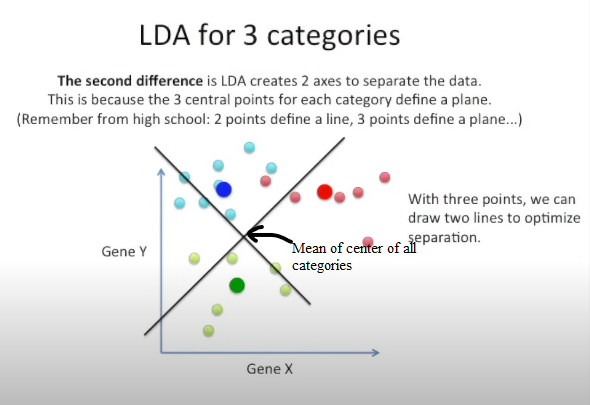

        Example:

        Consider a dataset with two features (x₁ and x₂) and two classes (Class A and Class B). Applying LDA would involve:

        - Calculating the mean vectors for both classes.
        - Computing the within-class and between-class scatter matrices.
        - Solving for the eigenvectors and eigenvalues of 𝑆<sub>𝑊</sub><sup>−1</sup>𝑆<sub>𝐵</sub>.
        - Selecting the eigenvector with the largest eigenvalue to define the new feature axis.
        - Projecting the original data onto this new axis, resulting in a one-dimensional feature that best separates the two classes.
        
        Benefits of Using LDA for Feature Extraction:

        - Dimensionality Reduction: LDA reduces the number of features while preserving class discriminatory information, which can simplify models and reduce overfitting.
        - Improved Class Separability: By focusing on the directions that maximize class separation, LDA enhances the model's ability to distinguish between classes.
        - Computational Efficiency: Reducing the number of features can lead to faster training times for machine learning models.
        It's important to note that LDA assumes that the data is normally distributed and that the classes have identical covariance matrices. Violations of these assumptions can affect the effectiveness of LDA for feature extraction.

    3. t-Distributed Stochastic Neighbor Embedding (t-SNE)  
        t-SNE is a non-linear dimensionality reduction algorithm particularly well-suited for visualizing high-dimensional data by modeling each high-dimensional object by a two- or three-dimensional point in such a way that similar objects are modeled by nearby points and dissimilar objects are modeled by distant points.
        Mathematically, it seeks to minimize the divergence between two distributions: a distribution that measures pairwise similarities of the input objects and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding. 
        Steps involved -

        - Compute pairwise similarities
        - Construct probability distributions from above   
        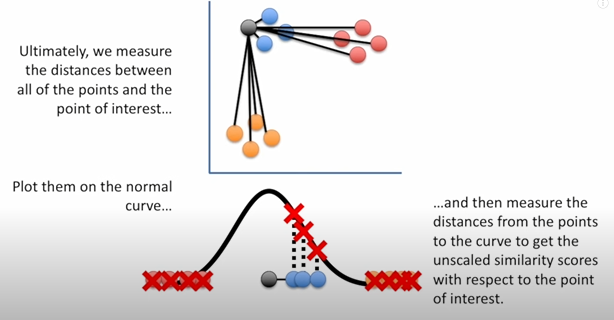
        - Minimize KL Divergence: Use gradient descent to find a low-dimensional representation that minimizes the divergence between the two distributions.  
        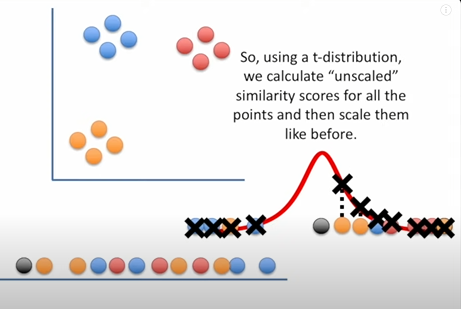
        - This techniques is excellent for visualizing complex, high-dimensional data (ex: clusters in gene expression data) in two or three dimensions. But, computationally expensive and sensitive to hyperparameters (e.g., : density of the cluster).  
        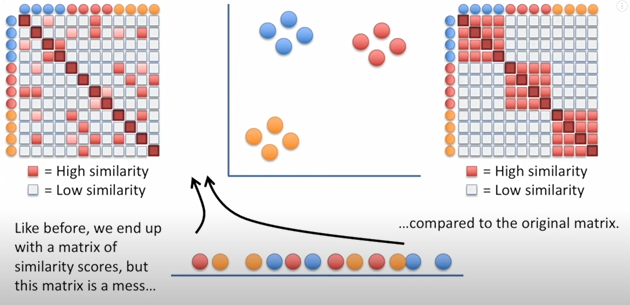

    4. Unform Manifold Approximation and Projection (UMAP)  
        Its is a fairly flexible non-linear dimension reduction algorithm. It seeks to learn the manifold structure of your data and find a low dimensional embedding that preserves the essential topological structure of that manifold. 
        Very similar to t-SNE. \
        Two differences:  
        1. t-SNE starts at random data points placement for lower dimension mapping and the moves. UMAP will result the same placement for same data. 
        2. UMAP is faster because for each lower dimension clustering it can move one or subset of points at once. Where as t-SNE can move only one.  
        
        Steps:  
        - Create a high-dimensional graph where each data point is connected to its nearest neighbors.
        - Use stochastic gradient descent to optimize the graph’s structure.
        - Map the optimized graph into a lower-dimensional space.
        - Its advantage is its scalable (more than t-SNE), preserves both local and global data structures, and often produces clearer cluster separation. But, can be sensitive to the choice of hyper-parameters (number of nighbours: less - finer details captured, More: broader trends can be captured) and requires careful tuning.

Comparison of PCA, t-SNE, and UMAP  
Key Differences
- PCA: Linear, fast, good for linearly separable data.
- t-SNE: Non-linear, excellent for visualization, computationally expensive.
- UMAP: Non-linear, scalable, preserves local and global structure.  

When to Use Each Technique
- PCA: When data is linearly separable or when interpretability of components is crucial.
- t-SNE: For visualizing complex, high-dimensional data in two or three dimensions.
- UMAP: For preserving structure in large datasets and when scalability is important.

#### 10.1.1 t-SNE Example

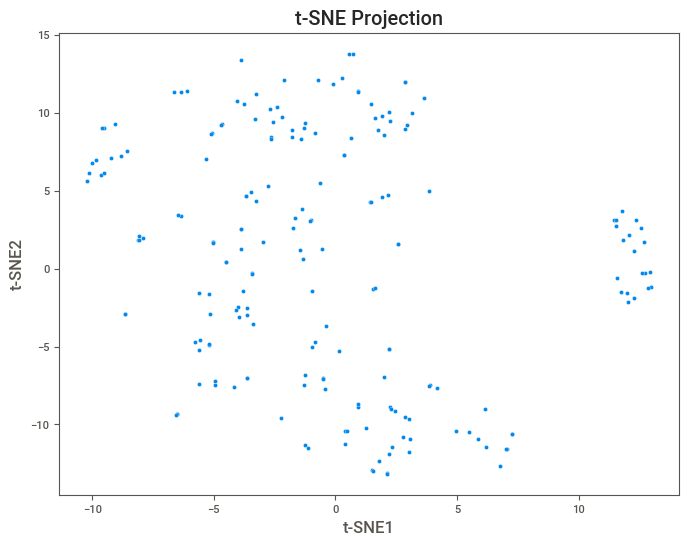

In [48]:
# Apply t-SNE on the standardized numeric features
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(scaled_features)
tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE1', 't-SNE2'])

plt.figure(figsize=(8,6))
sns.scatterplot(x='t-SNE1', y='t-SNE2', data=tsne_df)
plt.title("t-SNE Projection")
plt.show()

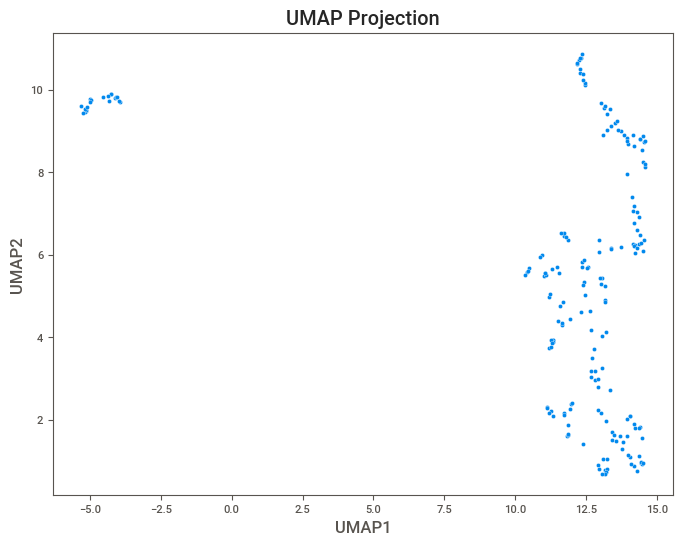

In [49]:
# #### 10.1.2 UMAP Example (if installed)
try:
    reducer = umap.UMAP(random_state=42)
    umap_results = reducer.fit_transform(scaled_features)
    umap_df = pd.DataFrame(umap_results, columns=['UMAP1', 'UMAP2'])
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(x='UMAP1', y='UMAP2', data=umap_df)
    plt.title("UMAP Projection")
    plt.show()
except Exception as e:
    print("UMAP could not be executed:", e)

### 10.2 Interactive Visualizations with Plotly

Create an interactive pair plot (if enough numeric features are available).

In [50]:
if len(numeric_cols) >= 3:
    fig = px.scatter_matrix(df, dimensions=numeric_cols[:5],
                            color="fuel-type" if "fuel-type" in df.columns else None,
                            title="Interactive Pair Plot")
    fig.show()